![banner cnns ppgcc ufsc](http://www.lapix.ufsc.br/wp-content/uploads/2019/04/VC2.png)


<a href="https://colab.research.google.com/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/01.00-IPython-Beyond-Normal-Python.ipynb"><img align="left"  src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab" title="Open and Execute in Google Colaboratory"></a>&nbsp; &nbsp;<a href=""><img align="left" src="http://www.lapix.ufsc.br/wp-content/uploads/2019/04/License-CC-BY-ND-4.0-orange.png" alt="Creative Commons 4.0 License" title="Creative Commons 4.0 License"></a>&nbsp; &nbsp; <a href=""><img align="left" src="http://www.lapix.ufsc.br/wp-content/uploads/2019/04/Jupyter-Notebook-v.1.0-blue.png" alt="Jupyter Version" title="Jupyter Version"></a>&nbsp; &nbsp;<a href=""><img align="left"  src="http://www.lapix.ufsc.br/wp-content/uploads/2019/04/Python-v.3.7-green.png" alt="Python Version" title="Python Version"></a>

# Advanced Feature Descriptors

This notebook is dedicated to more advanced feature descriptors that were developed or turned popular in the late 1990's and early 2000's, such as *HOG, SIFT, SURF* and *ORB*. We will also discuss some not so obvious applications such as *Image Stitching* and the limitations of these feature detectors. 

In [147]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

from ipywidgets import interact_manual
import matplotlib.pyplot as plt
import cv2
import os

# Test if your notebook is running on Google Colab
# You'll use this when choosing between doing interaction via ipywidgets or not. 
try:
    import google.colab
    _ON_COLAB = True
except:
    _ON_COLAB = False

print('Running on Google Colab = ', _ON_COLAB)

Running on Google Colab =  False


## HOG - Histogram of Oriented Gradients

This is the most well-known and simplest of the feature detectors that we will discuss here.

HOG Examples:
1. [PyImagesearch Histogram of Oriented Gradients (and car logo recognition example)](https://gurus.pyimagesearch.com/lesson-sample-histogram-of-oriented-gradients-and-car-logo-recognition/)
1. [sciKit standard example](https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html)

HOG References:

1. Dalal, N. and Triggs, B., “Histograms of Oriented Gradients for Human Detection,” IEEE Computer Society Conference on Computer Vision and Pattern Recognition, 2005, San Diego, CA, USA.
1. David G. Lowe, “Distinctive image features from scale-invariant keypoints,” International Journal of Computer Vision, 60, 2 (2004), pp. 91-110.

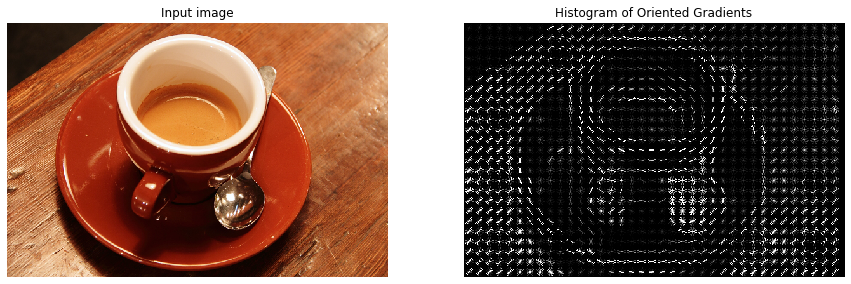

In [150]:
import matplotlib.pyplot as plt

from skimage import feature
from skimage import data, exposure


image = data.coffee()

fd, hog_image = feature.hog(image, orientations=8, pixels_per_cell=(16, 16),
                    cells_per_block=(1, 1), visualize=True, multichannel=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 9), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(image, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()

In [4]:
from skimage import data, exposure
image = data.astronaut()
cv2.imshow("test", image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# SIFT, SURF and ORB

**Tests:**
        - SIFT (cv2.xfeatures2d.SIFT)
        - SURF (cv2.xfeatures2d.SURF)
        - ORB (cv2.ORB)

**REFERENCES:**

Tutorials for Python OPenCV 3.0:
* https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_tutorials.html

SIFT, SURF, ORB:
* https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_sift_intro/py_sift_intro.html
* https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_surf_intro/py_surf_intro.html
* https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_orb/py_orb.html

Feature Identification:
* https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_table_of_contents_feature2d/py_table_of_contents_feature2d.html
* https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_feature2d/py_feature_homography/py_feature_homography.html


# Feature Detection Definitions and Initializations

### Collect Image File Names

In [151]:
# Find all .jpg files in the folder
reitorias = [x for x in os.listdir('../data/reitoria/') if x.endswith(".jpg")]
# Sort them in alphabetical order
reitorias = sorted(reitorias)
reitorias

['reitoria1.jpg', 'reitoria2.jpg', 'reitoria3.jpg', 'reitoria4.jpg']

## Show Images

### Load and show the original, color images

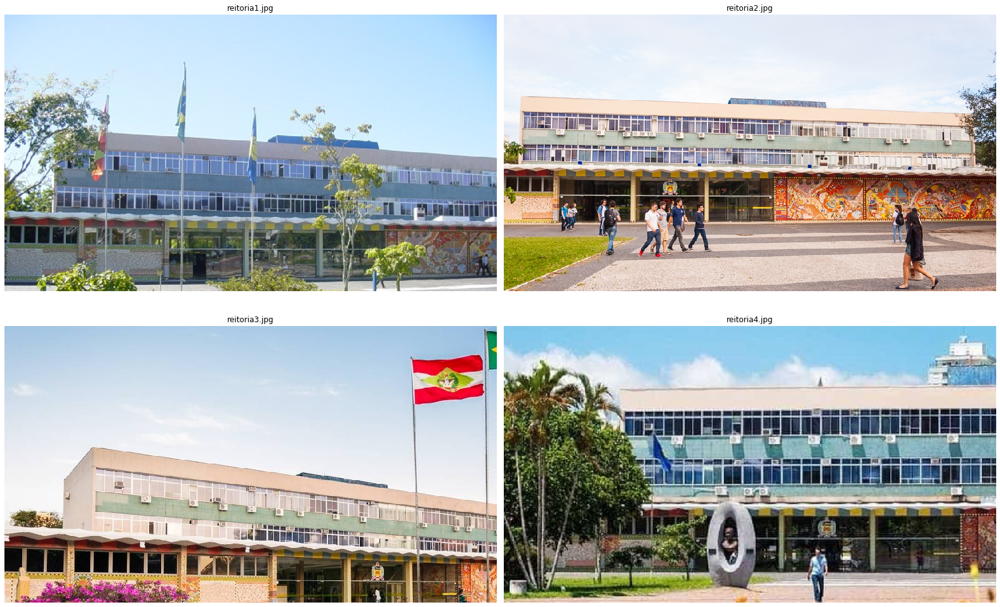

In [152]:
# Prepare a plot
fig, axes = plt.subplots(nrows = len(reitorias)//2,ncols=2, figsize=(22, 14), sharex=True, sharey=True)
ax = axes.ravel()

# Traverse reitorias image list
i = 0
# Create two empty lists, one for the oiginal images, another for the grayvalues images
images = []
gray_images = []
for reitoria in reitorias:
    # Load image
    image = cv2.imread('../data/reitoria/'+reitoria)
    # OpenCV loads images in BGR order, you have to convert it to RGB:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Append the RGB image to the colored images list
    images.append(image)
    # Convert the RGB image to grayvalues
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Append the grayvalues image to the grayvalues image list
    gray_images.append(gray)
    # Build image plot with the color images
    ax[i].imshow(image, cmap=plt.cm.gray)
    ax[i].set_title(reitoria)
    # Update counter
    i = i + 1
    
for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

In [44]:
# Look at the color images list:
images

[array([[[180, 218, 254],
         [180, 218, 254],
         [180, 218, 254],
         ...,
         [139, 189, 250],
         [139, 189, 250],
         [139, 189, 250]],
 
        [[180, 218, 254],
         [180, 218, 254],
         [180, 218, 254],
         ...,
         [140, 190, 251],
         [139, 189, 250],
         [139, 189, 250]],
 
        [[180, 218, 254],
         [180, 218, 254],
         [180, 218, 254],
         ...,
         [141, 191, 252],
         [140, 190, 251],
         [140, 190, 251]],
 
        ...,
 
        [[ 70,  84,   9],
         [ 73,  87,  12],
         [ 83,  97,  20],
         ...,
         [155, 175,  62],
         [159, 179,  66],
         [158, 178,  65]],
 
        [[ 92, 106,  31],
         [ 90, 104,  29],
         [ 98, 112,  35],
         ...,
         [155, 175,  62],
         [162, 182,  69],
         [162, 182,  69]],
 
        [[122, 136,  61],
         [109, 123,  48],
         [102, 116,  39],
         ...,
         [156, 176,  63],
  

### Show the grayvalue versions of the images

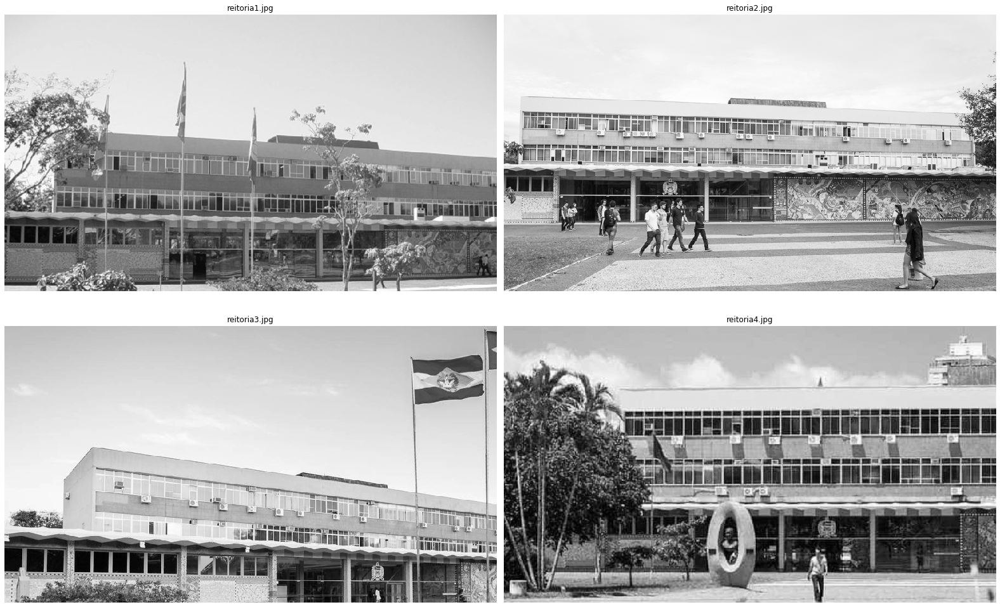

In [153]:
# Prepare a plot
fig, axes = plt.subplots(nrows = len(reitorias)//2,ncols=2, figsize=(22, 14), sharex=True, sharey=True)
ax = axes.ravel()

# Traverse image list
i = 0
for gray in gray_images:
    # Build image plot with the grayvalue images
    ax[i].imshow(gray, cmap=plt.cm.gray)
    ax[i].set_title(reitorias[i])
    # Update counter
    i = i + 1
    
for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

In [45]:
# Look at the gravalues image list:
gray_images

[array([[211, 211, 211, ..., 181, 181, 181],
        [211, 211, 211, ..., 182, 181, 181],
        [211, 211, 211, ..., 183, 182, 182],
        ...,
        [ 71,  74,  84, ..., 156, 160, 159],
        [ 93,  91,  99, ..., 156, 163, 163],
        [123, 110, 103, ..., 157, 165, 167]], dtype=uint8),
 array([[236, 237, 237, ..., 229, 229, 228],
        [237, 237, 237, ..., 230, 230, 230],
        [237, 236, 237, ..., 230, 230, 230],
        ...,
        [162, 167, 175, ..., 131, 139, 139],
        [178, 178, 177, ..., 161, 168, 169],
        [168, 164, 166, ..., 182, 177, 176]], dtype=uint8),
 array([[188, 188, 188, ..., 178, 178, 178],
        [188, 188, 188, ..., 178, 178, 178],
        [188, 188, 188, ..., 178, 178, 178],
        ...,
        [ 79,  77,  75, ...,  70,  70,  70],
        [ 63,  63,  62, ...,  69,  69,  69],
        [ 54,  54,  54, ...,  66,  66,  66]], dtype=uint8),
 array([[183, 182, 181, ..., 176, 178, 180],
        [184, 182, 181, ..., 177, 179, 181],
        [183, 18

In [154]:
def create_matcher(homography):
    # Will I use perspective correction for the matching?
    if homography:
        match_method = 'homography'
        print('Creating a FlannBasedMatcher to use with homography')
        FLANN_INDEX_KDTREE = 0
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        matcher = cv2.FlannBasedMatcher(index_params, search_params)
    else:
        match_method = 'BFM'
        print('Creating a BFMatcher with default params')
        matcher = cv2.BFMatcher()
    return matcher, match_method

# MATCHING

def do_matches_sorting(matches, threshold):
    """ Sort matches accordingly to their threshold"""
    good = []
    for m, n in matches:
        if m.distance < threshold * n.distance:
            good.append([m])
    return good

## ORB (Oriented FAST and Rotated BRIEF)

 * https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_orb/py_orb.html

In [165]:
print('Creating ORB instance...')
orb = cv2.ORB_create(nfeatures=2000, 
                     # scoreType=cv2.ORB_FAST_SCORE,
                     edgeThreshold=50, patchSize=31, nlevels=16, 
                     fastThreshold=10, scaleFactor=1.2, WTA_K=2)

Creating ORB instance...


### Detect Keypoints and Store Points and Descriptors in a List

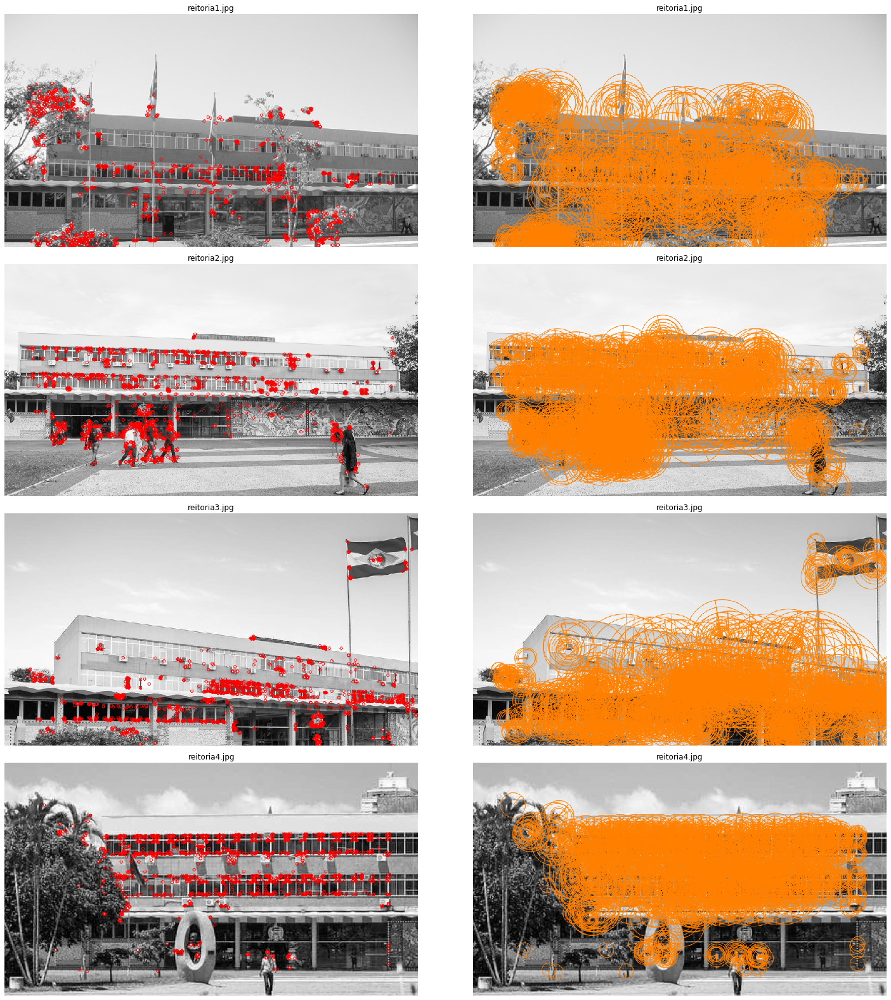

In [166]:
# Initialize a Keypoints and Images Dictionary
orb_dict = {}  # New dictionary for ORB objects

# Prepare a plot
fig, axes = plt.subplots(nrows = len(reitorias), ncols=2, figsize=(22, 22), sharex=True, sharey=True)
ax = axes.ravel()

# Traverse image list
i = 0
j = 0
for gray in gray_images:
    # find the keypoints with ORB
    kp = orb.detect(gray,None)

    # compute the descriptors with ORB
    orb_tuple = orb.compute(gray, kp)
    
    # Append the result to the orb_tuples_list list:
    # 'reitoria1.jpg':[orb_tuple, gray]
    orb_list = list(orb_tuple)
    orb_list.append(gray)
    orb_dict[reitorias[j]] = orb_list

    # draw only keypoints location,not size and orientation
    gray2 = cv2.drawKeypoints(gray, kp, outImage=np.array([]), color=(255,0,0), flags=0)
    ax[i].imshow(gray2)
    ax[i].set_title(reitorias[j])
    gray3 = cv2.drawKeypoints(gray, kp, outImage=np.array([]), color=(255,128,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    ax[i+1].imshow(gray3)
    ax[i+1].set_title(reitorias[j])
    # Update counter
    i = i + 2
    j = j + 1
    
for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

In [49]:
orb_dict

{'reitoria1.jpg': [[<KeyPoint 0x7fdf4b641810>,
   <KeyPoint 0x7fdf4b641840>,
   <KeyPoint 0x7fdf4b641870>,
   <KeyPoint 0x7fdf4b6418a0>,
   <KeyPoint 0x7fdf4b6418d0>,
   <KeyPoint 0x7fdf4b641900>,
   <KeyPoint 0x7fdf4b641930>,
   <KeyPoint 0x7fdf4b641960>,
   <KeyPoint 0x7fdf4b641990>,
   <KeyPoint 0x7fdf4b6419c0>,
   <KeyPoint 0x7fdf4b6419f0>,
   <KeyPoint 0x7fdf4b641a20>,
   <KeyPoint 0x7fdf4b641a50>,
   <KeyPoint 0x7fdf4b641a80>,
   <KeyPoint 0x7fdf4b641ab0>,
   <KeyPoint 0x7fdf4b641ae0>,
   <KeyPoint 0x7fdf4b641b10>,
   <KeyPoint 0x7fdf4b641b40>,
   <KeyPoint 0x7fdf4b641b70>,
   <KeyPoint 0x7fdf4b641ba0>,
   <KeyPoint 0x7fdf4b641bd0>,
   <KeyPoint 0x7fdf4b641c00>,
   <KeyPoint 0x7fdf4b641c30>,
   <KeyPoint 0x7fdf4b641c60>,
   <KeyPoint 0x7fdf4b641c90>,
   <KeyPoint 0x7fdf4b641cc0>,
   <KeyPoint 0x7fdf4b641cf0>,
   <KeyPoint 0x7fdf4b641d20>,
   <KeyPoint 0x7fdf4b641d50>,
   <KeyPoint 0x7fdf4b641d80>,
   <KeyPoint 0x7fdf4b641db0>,
   <KeyPoint 0x7fdf4b641de0>,
   <KeyPoint 0x7fdf4b64

### Try to Match...

In [169]:
import itertools

matched_images = []
goodness_threshold = 0.8  # A higher threshold detects more points and more nonsense

matcher, match_method = create_matcher(True)

# Produce a pairwise combination of the keys without repeated sets
pairs = itertools.combinations(orb_dict.keys(), 2)

# Iterate through the pairs of the combination and match the key-points of the images
for key_tuple in pairs:
    key1 = key_tuple[0]
    key2 = key_tuple[1]
    #print(orb_dict[key1][0])
    print('Matching '+key1+' with '+key2+ ' using ORB and '+match_method)
    
    desc1 = orb_dict[key1][1]
    desc2 = orb_dict[key2][1]

    
    desc1 = np.float32(desc1)
    desc2 = np.float32(desc2)
    
    matches = matcher.knnMatch(desc1, desc2, k=2)
    # Apply ratio test
    good = do_matches_sorting(matches, goodness_threshold)

    # Sort key-points in the order of their distance employing
    # a lambda function that takes the distance of the first
    # element of each Match (the Internet example is wrong!!!)
    good = sorted(good, key=lambda x: x[0].distance)
    
    # cv2.drawMatchesKnn expects list of lists as matches.
    matched_img = cv2.drawMatchesKnn(orb_dict[key1][2], orb_dict[key1][0],
                                     orb_dict[key2][2], orb_dict[key2][0],
                                     good, None, flags=2)
    matched_images.append(matched_img)

len(matched_images)

Creating a FlannBasedMatcher to use with homography
Matching reitoria1.jpg with reitoria2.jpg using ORB and homography
Matching reitoria1.jpg with reitoria3.jpg using ORB and homography
Matching reitoria1.jpg with reitoria4.jpg using ORB and homography
Matching reitoria2.jpg with reitoria3.jpg using ORB and homography
Matching reitoria2.jpg with reitoria4.jpg using ORB and homography
Matching reitoria3.jpg with reitoria4.jpg using ORB and homography


6

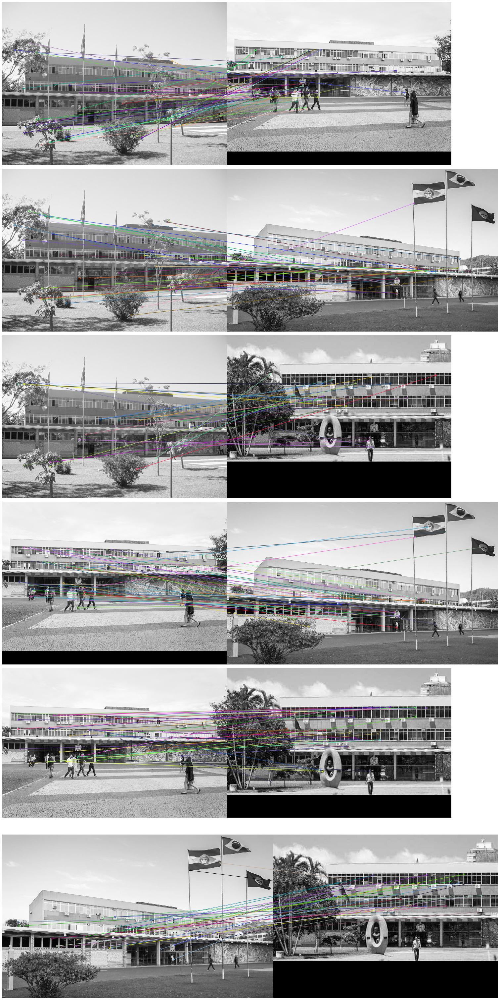

In [170]:
# Prepare a plot
fig, axes = plt.subplots(nrows = len(matched_images), ncols=1, figsize=(22, 42), sharex=True, sharey=True)
ax = axes.ravel()

# Traverse image list
i = 0
for match in matched_images:
    ax[i].imshow(match)
    ax[i].set_title('')
    # Update counter
    i = i + 1
    
for a in ax:
    a.axis('off')

fig.tight_layout()
plt.show()

![banner cnns ppgcc ufsc](http://www.lapix.ufsc.br/wp-content/uploads/2019/04/CC-incod.png)